<a href="https://colab.research.google.com/github/JSisam54/JSisam54/blob/main/pithchartm_classification_2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# I downloaded a program called Renaming Bulk Utility and it's brilliant for
# removing "Snapshot_" all "_"s and changing ".JPG" into lower case ".jpg" in one step!
# Another thing I learnt after multiple attempts at uploading my zip file - do it through drive.google.com : )
# I made sure I was in P Chartarum Vision 2023 and just dragged and dropped the file into it!!

# PSEUDOPITHOMYCES CHARTARUM CLASSIFICATION 2023
## Building a Machine Learning Model to Make Spore Counting Easier, Faster and Accurate.
### In 2023 we'll enlarge the image data set. Our assumption is that if our model has more photos to be trained on then it will perform better.
### Last year we gave it 499. In 2023 our final count from the facial eczema season was 1470 images or nearly three times as many as last time. These will be uploaded and preprocessed like before.

### End to End Binary Fungal Spore Identification

This notebook builds an end-end-end binary image classifier using TensorFlow 2.0 and TensorFlow Hub.

### 1. Problem
Identifying Pithomyces Chartarum spores from other similar shaped microscopic objects found in a pasture wash grid given an image.
When I'm looking down a microscope and I take a photo of something, I want to know if it is a Pithomyces Chartarum fungal spore or not.
### 2. Data
The data we're using is from a collection of images collected in the summer and autumn of 2023 while providing a spore counting service for two dairy farming clients.

### 3. Evaluation
The evaluation is a file with prediction probabilities for the two classifications i.e. 'pcs' and 'se' for each test image.

### 4. Features
Some information about the data:
* We're dealing with images (unstructured data) so it's best that we use deep learning/transfer learning.
* There are two spore 'types' which means there are two classes. A binary classification problem.
* There are 1,467 images in the training set. These images have labels.
* There will be 1,500 images in the test set. These images have no labels because we are going to predict them.


In [ ]:
# I'm up to Daniels Importing TensorFlow 2 Default issue video

### Setting up Our Data
We'll need to unzip the zip folder that contains all of our training images and their corresponding labels.

First though I'll neeed to look through my last project to find out how I : -


1.   processed my label xcel sheet raw format as well as changing

1.   the .JPG file types into .jpg ones


In [ ]:
# my data is in a zip file named "spore-type-classification.zip"
# it includes 1470 images in a folder "train-2023"
# as well as a .csv file with 1470 labels corresponding to the images
# each label will have an id number and a corresponding classification "pcs" or "se" like last time

In [ ]:
#!unzip "drive/MyDrive/P Chartarum Vision 2023/spore-type-classification.zip" -d "drive/MyDrive/P Chartarum Vision 2023/"

In [ ]:
# Import TensorFlow 2 and TensorFlow Hub into Colab

### Get our Workspace Ready

In [ ]:
import tensorflow as tf


In [ ]:
print("TF Version:", tf.__version__)

TF Version: 2.17.0


In [ ]:
# Import TensorFlow Hub
import tensorflow_hub as hub
print("TensorFlow Hub Version:", hub.__version__)

TensorFlow Hub Version: 0.16.1


In [ ]:
# Check for GPU Availability
print("GPU", "is available" if tf.config.list_physical_devices("GPU") else "Sorry not available")

GPU Sorry not available


# Getting Our Data Ready

### Turning images into Tensors or Matrices
With all machine learning models, our data must be in numerical format. This is what we need to do first.

We'll turn our images into Tensors or arrays.

Access our data and checking out the labels.

In [ ]:
# The labels for our training images are in a csv format.
# We'll use Pandas to get the file into this notebook
import pandas as pd
import numpy as np


In [ ]:
# Let's access our labels
fe_labels_23_csv = pd.read_csv("drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/fe_labels_23.csv")
fe_labels_23_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      1470 non-null   int64 
 1   spore   1470 non-null   object
dtypes: int64(1), object(1)
memory usage: 23.1+ KB


In [ ]:
# How many in each classification?
# Should be roughly the same numbe of pc and se's
fe_labels_23_csv["spore"].value_counts()

,count
spore,
pc,742
se,728


# Preparing our Images

In [ ]:
# Let's view an image within this notebook
from IPython.display import Image

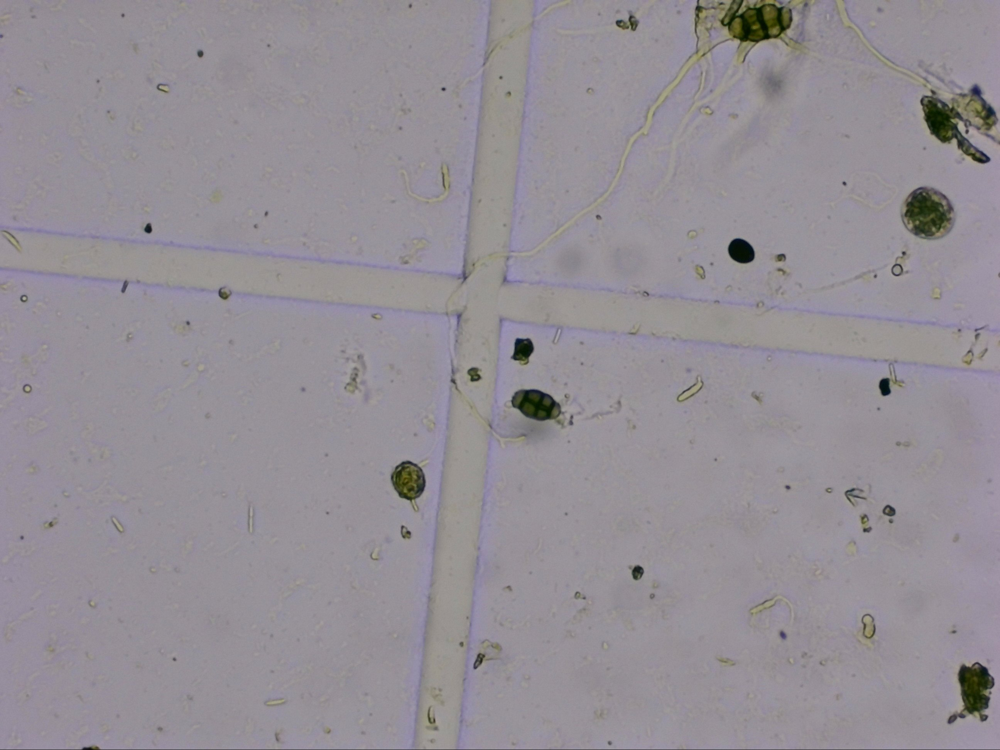

In [ ]:
Image("drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/2023030128.jpg")

# Create Pathnames from Image ID's

In [ ]:
# Yppee!! I'm making progress AT LAST!!
fe_labels_23_csv

,id,spore
0,20230118,pc
1,202301181,se
2,202301182,se
3,202301183,pc
4,202301184,se
...,...,...
1465,2023042836,se
1466,2023042837,se
1467,2023042838,se
1468,2023042839,se


In [ ]:
# will need to convert integers in the "id" column to strings
# so can concantenate them
fe_labels_23_csv["id"] = fe_labels_23_csv["id"].astype(str)
fe_labels_23_csv.head()

,id,spore
0,20230118,pc
1,202301181,se
2,202301182,se
3,202301183,pc
4,202301184,se


In [ ]:
fe_labels_23_csv[530:580]

,id,spore
530,2023030194,se
531,2023030195,se
532,2023030196,se
533,2023030197,se
534,2023030198,se
535,2023030199,se
536,20230301100,se
537,20230301101,se
538,20230301102,se
539,20230303,pc


In [ ]:
# Now concantenation can happen
filenames = ["drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/" + fname + ".jpg" for fname in fe_labels_23_csv["id"]]
filenames[:3]

['drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/20230118.jpg',
 'drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/202301181.jpg',
 'drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/202301182.jpg']

In [ ]:
# Let's check the number of these filenames
len(filenames)

1470

In [ ]:
# And compare with how many actual images in the train folder we have
# best to do it now not later
import os
actual_images = os.listdir("drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023")
actual_images[:3]

['2023030133.jpg', '2023030134.jpg', '2023030135.jpg']

In [ ]:
# How many actual images?
len(actual_images)

1470

In [ ]:
# Okay so I have one more image or file in train-2023 than I want
# It is a Thumbs.db file
# let's try deleting it using !rmdir "drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/Thumbs.db
# !rm "drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/Thumbs.db"

In [ ]:
# lets find out how many actual images there are again
len(actual_images)

1470

In [ ]:
# Compare the lengths of these two lists before we go any further
if len(os.listdir("drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023"))==len(filenames):
  print("Yippee!! They match up. You can keep going Jane!")
else:
  print("Crap. I have more work to do")

Yippee!! They match up. You can keep going Jane!


In [ ]:
# FINALLY I GOT IT SUSSED!


# Turning Data Labels Into Numbers

My two classification labels aren't numerical. We turn them into numbers by creating boolean versions.

We convert each label into a numpy array, so we can create a Tensor tuple down the track. The tuple will be in the form `(image, label)`

In [ ]:
# Lets start preparing our data labels
# Turn our labels into an array
import numpy as np
labels_23 = fe_labels_23_csv["spore"]
labels_23 = np.array(labels_23)
labels_23

array(['pc', 'se', 'se', ..., 'se', 'se', 'se'], dtype=object)

In [ ]:
# how many are there?
len(labels_23)

1470

In [ ]:
# is it the same as the number of filenames?
if len(labels_23)==len(filenames):
  print("Goodee! We can keep going")
else:
  print("Crap! We've got more work to do.")

Goodee! We can keep going


In [ ]:
# Now to convert these strings into booleans
unique_spores = np.unique(labels_23)
unique_spores

array(['pc', 'se'], dtype=object)

In [ ]:
len(unique_spores)

2

In [ ]:
# Let's have a look at the first label
# labels_23[0] == unique_spores
print(labels_23[0])



pc


In [ ]:
# what happens if we run this code
labels_23[0] == unique_spores

array([ True, False])

What have we done here?


*   the first image IS a PC spore

*   it's label is "pc"
*   the first entry in the array for this label is "True"
*   this label is now a boolean!



In [ ]:
# let's do this for all of the labels now
boolean_labels = [label == unique_spores for label in labels_23]
boolean_labels[:5]

[array([ True, False]),
 array([False,  True]),
 array([False,  True]),
 array([ True, False]),
 array([False,  True])]

In [ ]:
# Another example
boolean_labels[54]

array([ True, False])

In [ ]:
# It is a pc label
# And it's corresponding filename
filenames[54]

'drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/202301246.jpg'

In [ ]:
# The first five boolean labels and their corresponding filenames
boolean_labels[:5], filenames[:5]

([array([ True, False]),
  array([False,  True]),
  array([False,  True]),
  array([ True, False]),
  array([False,  True])],
 ['drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/20230118.jpg',
  'drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/202301181.jpg',
  'drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/202301182.jpg',
  'drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/202301183.jpg',
  'drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/202301184.jpg'])

In [ ]:
# Just check the number of our boolean labels again
len(boolean_labels)

1470

In [ ]:
# Turn our boolean array into one of integers
print(labels_23[0])     # this is the original label
print(np.where(unique_spores == labels_23[0]))   # this is the index where the label occurs
print(boolean_labels[0].argmax())            # and this is the index where the label occurs in our boolean array
print(boolean_labels[0].astype(int))     # there should be a "1" where this sample label occurs

pc
(array([0]),)
0
[1 0]


In [ ]:
# let's try another one
print(labels_23[5])
print(boolean_labels[5].astype(int))

se
[0 1]


# Creating Our Own Validation Set

We're going to create our own. So we can do some experiments.

The model will be trained on our training dataset and then we'll see how it performs with the validation data.

It's like a practice exam.

In [ ]:
# Set up our X and y variables
X = filenames
y = boolean_labels

In [ ]:
# And now NUM_IMAGES
# I don't have lots so I want to use all of them for now
NUM_IMAGES = 1470


In [ ]:
# In the last cell you can set up a slider which looks nice
# Now to split this data into train and validation splits
from sklearn.model_selection import train_test_split

In [ ]:
# Split them into training and validation sets of total size = 1470 or NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                   y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                   random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(1176, 1176, 294, 294)

In [ ]:
# Let's have a quick look at the training data
X_train[:5], y_train[:5]

(['drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/202303302.jpg',
  'drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/2023030462.jpg',
  'drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/2023020765.jpg',
  'drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/202304048.jpg',
  'drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/train-2023/2023041827.jpg'],
 [array([ True, False]),
  array([ True, False]),
  array([False,  True]),
  array([ True, False]),
  array([ True, False])])

# Pre-processing Images and Labels - Turning Them Into Tensors

We want to create a function to do this.
It will:


1.   Take an image file path as input
2.   Use TensorFlow to read the file and save it to a variable `image`
1.   Turn our `image` which is a jpg, into a Tensor

1.   Normalize our image or convert color channels values from 0 - 255 to 0 - 1

2.   Resize it to be (224,224)
1.   Finally return the modified `image`








### First let's see what pre-processing just one image and label looks like

In [ ]:
# Convert image to a NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[54])
image.shape

(1944, 2592, 3)

In [ ]:
# This image is 1944 pixels high and 2592 pixels wide with 3 color channels
# Let's check out the values. What are the minimum and maximum ones?
image.min(), image.max()


(0, 207)

In [ ]:
# Let's look at the first two images
image[:2]

array([[[166, 157, 174],
        [166, 157, 174],
        [167, 158, 175],
        ...,
        [171, 158, 175],
        [174, 161, 178],
        [176, 163, 180]],

       [[168, 159, 176],
        [168, 159, 176],
        [167, 158, 175],
        ...,
        [172, 159, 176],
        [174, 161, 178],
        [175, 162, 179]]], dtype=uint8)

In [ ]:
# Our two images are now three dimensional arrays
# Let's convert them into Tensors using tf.constant()
tf.constant(image[:2])

<tf.Tensor: shape=(2, 2592, 3), dtype=uint8, numpy=
array([[[166, 157, 174],
        [166, 157, 174],
        [167, 158, 175],
        ...,
        [171, 158, 175],
        [174, 161, 178],
        [176, 163, 180]],

       [[168, 159, 176],
        [168, 159, 176],
        [167, 158, 175],
        ...,
        [172, 159, 176],
        [174, 161, 178],
        [175, 162, 179]]], dtype=uint8)>

In [ ]:
# TensorFlow has converted the images into tensor slices of height 2 pixels instead of 1944        !
# It will be faster running our Deep Learning model with Googles GPU with our images in this format

In [ ]:
#tensor = tf.io.read_file(filenames[54])

In [ ]:
#tensor = tf.image.decode_jpeg(tensor, channels=3)

In [ ]:
#tensor = tf.image.convert_image_dtype(tensor, tf.float32)

In [ ]:
#tensor = tf.image.resize(tensor, size=[224, 224])

In [ ]:
#tensor

Now we've seen what an image looks like as a Tensor, we're going to pre-process it with code and then create a function to pre-process all of them.

In [ ]:
# Here's the function
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  """
Takes an image file path and turns the image into a Tensor
  """
  # read in an image file
  image = tf.io.read_file(image_path)
  # turn the jpeg image into a numerical Tensor with three colour channels red, blue and green
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the colour channel values to 0 - 1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize our image to the desired value or (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
# It's best to do this with just one image initially to follow what the code is doing!!
# Like this
# tensor = tf.io.read_file(filenames[:26])
# tensor = tf.image.decode_jpg(tensor, channels=3)
# tensor = tf.image.convert_image_dtype(tensor, tf.float32)
# tensor = tf.image.resize(tensor, size=[IMG_SIZE, IMG_SIZE])


In [ ]:
# Okay let's test out this function and use float to convert values to those between 0 and 1
(process_image(X[54]), tf.constant(y[54]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.6620448 , 0.6306723 , 0.6894958 ],
         [0.6514506 , 0.6239996 , 0.6520108 ],
         [0.6411665 , 0.6176371 , 0.6333234 ],
         ...,
         [0.66373545, 0.6558923 , 0.6598139 ],
         [0.6665767 , 0.64696884, 0.67049825],
         [0.66323596, 0.6210397 , 0.6731188 ]],
 
        [[0.6530112 , 0.62163866, 0.6804622 ],
         [0.64431775, 0.61686677, 0.644878  ],
         [0.6418468 , 0.61831737, 0.63400364],
         ...,
         [0.66774684, 0.648139  , 0.6638253 ],
         [0.6787214 , 0.63950574, 0.67423975],
         [0.6764006 , 0.6489496 , 0.6764006 ]],
 
        [[0.64984995, 0.62632054, 0.6812225 ],
         [0.6390056 , 0.61491597, 0.6322829 ],
         [0.65131056, 0.62778115, 0.6356243 ],
         ...,
         [0.6511701 , 0.6237191 , 0.6511701 ],
         [0.68103236, 0.6535814 , 0.68103236],
         [0.67003816, 0.6504303 , 0.67698044]],
 
        ...,
 
        [[0.6565726 , 0.63304317

In [ ]:
# YAY!! IT WORKED FINALLY!!

# Turning Data into Batches

We do this because small batches don't take so much memory to process. It's a more efficient way of doing things.

TensorFlow likes our data in the form of a tuple.

A tuple is a pair. it's ordered and unchangeable e.g `(image,label)`

In [ ]:
# TensorFlow will try to find patterns in these batches of 32 tuples
# We'll set up a loop which will go through all 5,000 train and validation images + their labels
# First though a function to create the tuples. We need to find labels for each image.

def get_image_label(image_path, label):
  """

 This function takes an image file path name and the associated label,
 processes the image and returns a tuple of (image, label)

  """
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.6020308 , 0.57065827, 0.6272409 ],
         [0.59278715, 0.56533617, 0.5967087 ],
         [0.58530414, 0.55785316, 0.5892257 ],
         ...,
         [0.60106146, 0.5736104 , 0.60106146],
         [0.5994399 , 0.5641458 , 0.6386556 ],
         [0.6169155 , 0.585543  , 0.63876563]],
 
        [[0.6002301 , 0.56885755, 0.6254402 ],
         [0.59433776, 0.5668868 , 0.59433776],
         [0.59302723, 0.56557626, 0.59302723],
         ...,
         [0.6058124 , 0.5744398 , 0.6175771 ],
         [0.61043406, 0.5790615 , 0.62219876],
         [0.607514  , 0.5761415 , 0.62712187]],
 
        [[0.5941877 , 0.5628151 , 0.62163866],
         [0.5947479 , 0.56337535, 0.6065126 ],
         [0.59910965, 0.5716587 , 0.59910965],
         ...,
         [0.6069323 , 0.57555974, 0.63438326],
         [0.60773313, 0.5763606 , 0.6351841 ],
         [0.62240833, 0.58319265, 0.6263299 ]],
 
        ...,
 
        [[0.58878547, 0.5574129 

### Now we've got a function to change our data into tuples of Tensors in the form (image, label), let's make a function to batch them.

Refer to this link for the TensorFlow documentation

[link text](https://www.tensorflow.org/api_docs/python/tf/data/Dataset)

In [ ]:
# Define the batch size. The experts say 32 is a good size.
BATCH_SIZE = 32

# This is a big function because we want to treat training, validation and test batches differently
# Note: "None" in Python is a nontype object, a null variable or object which is not 0 or any other value
# It marks parameters we haven't defined yet

In [ ]:
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
     """

     This function creates batches of data out of image(X) and label(y) pairs.
     It shuffles the data if it is a training batch just in case there is some kind of inherent order in our
     training data
     But doesn't shuffle if it is validation data
     Also accepts test data which has no label and therefore y=None

     """

# If the data is a test dataset
     if test_data:
      print("Creating training data batches....")
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))    # only filepaths no labels
      data_batch = data.map(process_image).batch(BATCH_SIZE)
      return data_batch

# If the data is a validation dataset we don't have to shuffle it.
# No training is being done so the order of the tensor tuples won't change the results.
     elif valid_data:
      print("Creating validation data batches....")
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                tf.constant(y)))
      data_batch = data.map(get_image_label).batch(BATCH_SIZE)
      return data_batch

# Lastly, if the data is a training dataset
     else:
      print("Creating training data batches..")
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X),   # how to shuffle this?
                                            tf.constant(y)))
# shuffle path names before mapping
# our image processing function is faster at shuffling cos it shuffles filenames not images
      data = data.shuffle(buffer_size=len(X))

      data = data.map(get_image_label)
# this creates (image, label) tuples and turns the image path into a preprocessed image

# now create a data_batch
      data_batch = data.batch(BATCH_SIZE)

     return data_batch






In [ ]:
# Time to use our big beast function and create some batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)


Creating training data batches..
Creating validation data batches....


In [ ]:
# YAY FINALLY IT WORKED
# Now to check out the attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)))

# Visualizing Our Data To See What's Going On

Our data is now in batches. Let's create a function to visualize these image, label pairs.

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
# Create a function to visualize images in a data batch
def show_25_images(images, labels):
  """
  displays a plot of 25 images and their labels from a data batch

  """
  # First set up the figure
  plt.figure(figsize=(10,10))
  # Now loop through 25 for displaying 25 images
  for i in range(25):
    # create subplots of 5 rows and 5 columns
    ax = plt.subplot(5, 5, i+1)
    # display an image
    plt.imshow(images[i])
    # add the image label as the title
    plt.title(unique_spores[labels[i].argmax()])
    # turn the grid lines off
    plt.axis("off")

In [ ]:
unique_spores[y[0].argmax()]

'pc'

### Before we use this function we'll need to unbatch our batch of images

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.5568628 , 0.5372549 , 0.5647059 ],
          [0.5337135 , 0.5219488 , 0.55724293],
          [0.5483894 , 0.53662467, 0.5719188 ],
          ...,
          [0.57438076, 0.5566637 , 0.5717197 ],
          [0.57207894, 0.5709588 , 0.57936203],
          [0.5895366 , 0.5660072 , 0.5816935 ]],
 
         [[0.54299724, 0.53123254, 0.5586835 ],
          [0.529972  , 0.5182073 , 0.5456583 ],
          [0.5243298 , 0.5125651 , 0.54001606],
          ...,
          [0.5958689 , 0.5723395 , 0.58802575],
          [0.5820129 , 0.57416975, 0.58593446],
          [0.59238595, 0.56885654, 0.5845428 ]],
 
         [[0.5429872 , 0.5351441 , 0.55475193],
          [0.5410765 , 0.53323334, 0.5528412 ],
          [0.5375851 , 0.52974194, 0.5493498 ],
          ...,
          [0.5882353 , 0.5647059 , 0.5803922 ],
          [0.58799547, 0.56446606, 0.58015233],
          [0.5865641 , 0.55911314, 0.5865641 ]],
 
         ...,
 
         [[0.57535017, 0.5557423 , 0.57927173],
          [0.55977

In [ ]:
len(train_images), len(train_labels)

(32, 32)

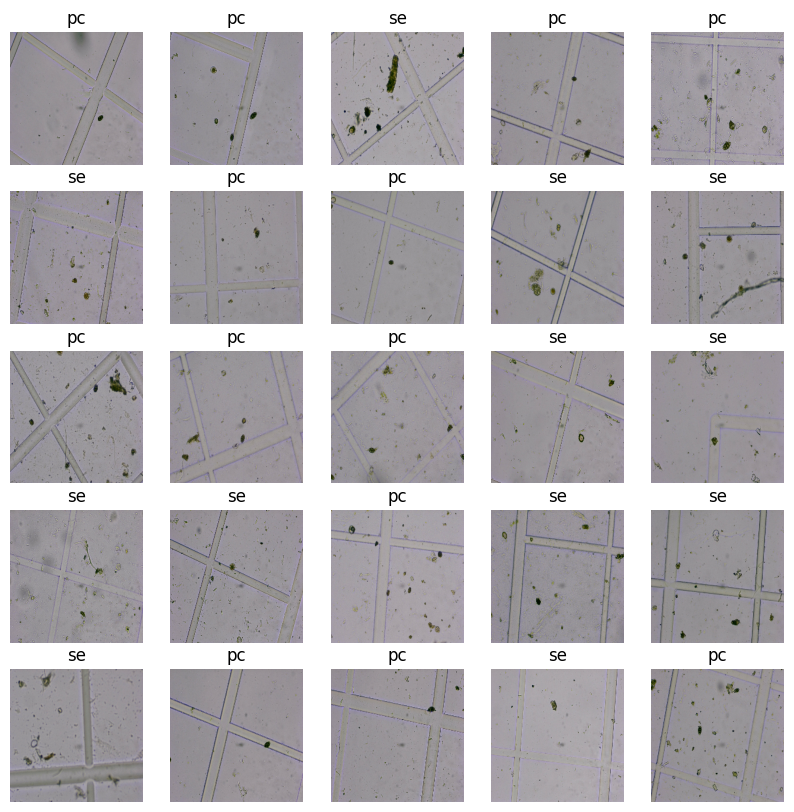

In [ ]:
# Now to use our plot function
show_25_images(train_images, train_labels)
# these are shuffled each time I run this cell so they should be different

In [ ]:
# and yes they were different when I ran it again
# Now for the validation data
val_images, val_labels = next(val_data.as_numpy_iterator())
val_images, val_labels


(array([[[[0.11222491, 0.20466188, 0.15998401],
          [0.12231894, 0.15456183, 0.        ],
          [0.22051825, 0.21722692, 0.0022409 ],
          ...,
          [0.59083575, 0.5712279 , 0.5986789 ],
          [0.6165268 , 0.5773111 , 0.6126052 ],
          [0.58263445, 0.53512555, 0.59137774]],
 
         [[0.24303722, 0.34113646, 0.26884755],
          [0.1422269 , 0.17386955, 0.        ],
          [0.2334734 , 0.23739497, 0.00529213],
          ...,
          [0.59607846, 0.5764706 , 0.6       ],
          [0.6391957 , 0.60085016, 0.6319327 ],
          [0.6058124 , 0.56883895, 0.6119762 ]],
 
         [[0.27241907, 0.35531223, 0.31008413],
          [0.24523813, 0.28130254, 0.03424371],
          [0.19343737, 0.22939175, 0.01155463],
          ...,
          [0.6118353 , 0.5820734 , 0.61421627],
          [0.6053522 , 0.57559025, 0.60773313],
          [0.6044717 , 0.57422024, 0.6139941 ]],
 
         ...,
 
         [[0.59123695, 0.5686079 , 0.6062228 ],
          [0.63592

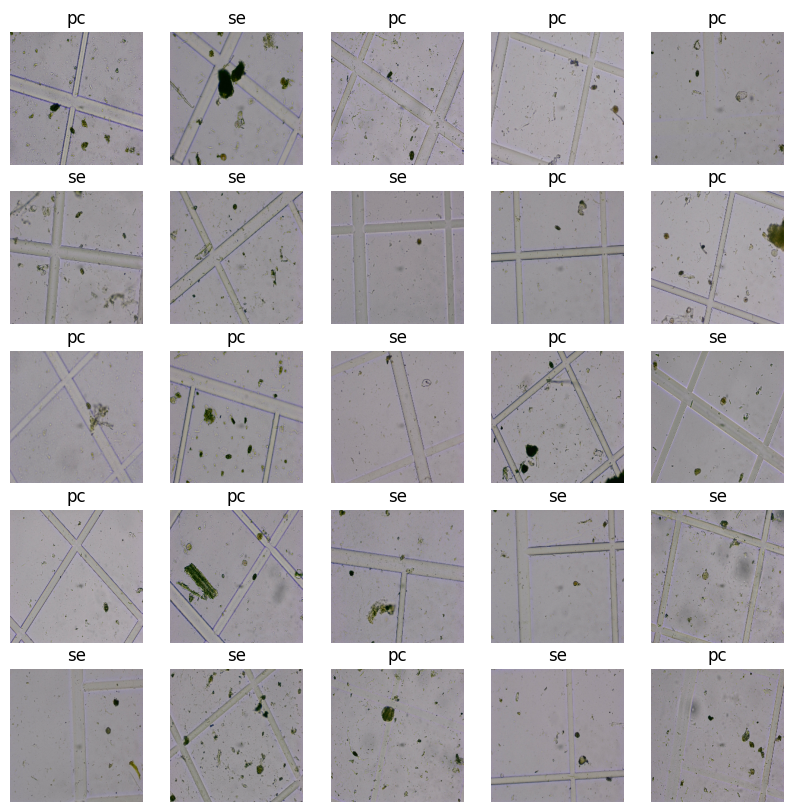

In [ ]:
# Now to visualize them
# I think these should be the same - they are not shuffled
show_25_images(val_images, val_labels)

In [ ]:
# Awesome. Yep all good. These are the same 32 validation images as before
# I've printed them out but will need a magnifying glass to see if the labels are correct!
# I think shuffing the training images will make our model stronger...it's getting tested on lots of images
# And it doesn't matter so much with val_images cos it's like a practice exam

# Building a Model

We need to define a few things before we build it.



1.   the INPUT shape i.e. our images shape in the form of tensors to our model.
2.   the OUTPUT shape i.e. the image labels in the form of tensors from our model.
1.   the URL of the model or DL algorithm we want to use. We'll get it from TensorFlow Hub.






### Preparing Our Inputs and Outputs

We'll be using existing models. This is called Transfer Learning.


In [ ]:
# Set up Input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]        # this is batch, height, width, no. of colour channels

# Set up Output shape to the model or our labels. There are 2 unique spore classifications.
OUTPUT_SHAPE = len(unique_spores)

# Set up model URL from TensorFlow Hub.
# Find some classification ones. I could use the same one as last time
# I think it was a pretrained mobilenet_v2 model
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/035-224-classification/versions/2"

### Choosing the best model and it's URL

From `tfhub.dev/google` or `www.kaggle.com/models/google`

In [ ]:
#model url https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
#using Kaggle https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/035-224-classification/versions/2

# TensorFlow and Keras

### There are two different kinds of models we can build


1.   A Sequential Model or a
2.   Functional Model

We're using a Sequential Model because it's made up of a simple stack of layers with only one input tensor and one output tensor.

Functional models have multiple inputs and outputs, as well as the layers in between.



In [ ]:
# We're going to create a function which takes the input shape, output shape and model we've chosen as parameters
# Defines the layers in a Keras model in a sequential fashion
# Compiles the model saying how it can be evaluated and improved
# Builds the model = tells the model the input shape it should be getting
# Returns the model

# First lets import keras
import tensorflow as tf
import keras
from keras import layers

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Import tensorflow_hub
  import tensorflow_hub as hub

  # Set up the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL),                  # layer 1 or the input layer
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="sigmoid") # layer 2 or the output layer
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.BinaryCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
# Now to see if it works!
model = create_model()
model.summary()


Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/035-224-classification/versions/2


ValueError: Only instances of `keras.Layer` can be added to a Sequential model. Received: <tensorflow_hub.keras_layer.KerasLayer object at 0x7d87a932a5f0> (of type <class 'tensorflow_hub.keras_layer.KerasLayer'>)

Okay so I got the code to work finally using "sigmoid" for activation and "BinaryCrossentropy" as my loss parameter.

Now to check this by listening to Daniels Building a DL Model no.3


In [ ]:
# All Done

# Callbacks

### Callbacks are functions that help a model during training.


1.   They save it's progress
2.   Check on it's progress
1.   Stop it's training if it doesn't improve

### The two callbacks we will use



*   TensorBoard Callback which helps track the progress of our model
*   Early Stopping Callback to stop the model from going on and on.







## TensorBoard Callback

In [ ]:
# Load TensorBoard. We use a magic function
%load_ext tensorboard

# Create a TensorBoard Callback that saves logs to a directory and passes to a fit function
# Visualize our models training logs with the`%tensorboard` magic function - do this after model training

In [ ]:
import datetime

def create_tensorboard_callback():
  # create a log directory in "spore-type-classification"
  logdir = os.path.join("drive/MyDrive/P Chartarum Vision 2023/spore-type-classification/logs",
                        # make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

In [ ]:
# This prevents our model overfitting by stopping the process when a certain
# evaluation metric stops improving. It trains too much and can't generalize well.
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)


In [ ]:
# What is an epoch? It's how many passes of our data we want our model to do.
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step:10}


# Training a Model on a Subset of Data

### Because I have just over 1000 images this time I'll be using all of them. It won't be a subset.


### A simple function to train our model.

In [ ]:
# Let's check to make sure a GPU is available
print( "GPU", "available (YESSS!!!)" if tf.config.list_physical_devices("GPU") else "not available")


GPU available (YESSS!!!)


In [ ]:
# Let's create that function which will train our model
# It will create a model using `create_model()`
# then a TensorBoard callback using our tensorboard_callback()
# call the fit() function on our model passing it our training data, validation data, no. of epochs to train for and callbacks
# finally return the model
def train_model():
  """
Trains a given model and returns the trained version
  """
  # create a model
  model = create_model()

  # create a new TensorBoard session each time we train our model
  tensorboard = create_tensorboard_callback()

  # fit the model to the data and passing the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # return the fitted model
  return model

# Fit the model to the data
#model = train_model()


In [ ]:
# Check no. of actual images
len(filenames)

1470

In [ ]:
len(actual_images)

1470

In [ ]:
# Now to fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/035-224-classification/versions/2
Epoch 1/100
37/37 [==============================] - 294s 8s/step - loss: 0.7309 - accuracy: 0.5519 - val_loss: 0.6628 - val_accuracy: 0.6224
Epoch 2/100
37/37 [==============================] - 80s 2s/step - loss: 0.6647 - accuracy: 0.6190 - val_loss: 0.6271 - val_accuracy: 0.6599
Epoch 3/100
37/37 [==============================] - 75s 2s/step - loss: 0.6368 - accuracy: 0.6378 - val_loss: 0.6141 - val_accuracy: 0.6871
Epoch 4/100
37/37 [==============================] - 78s 2s/step - loss: 0.6231 - accuracy: 0.6735 - val_loss: 0.6356 - val_accuracy: 0.6531
Epoch 5/100
37/37 [==============================] - 82s 2s/step - loss: 0.6270 - accuracy: 0.6429 - val_loss: 0.6336 - val_accuracy: 0.6429
Epoch 6/100
37/37 [==============================] - 75s 2s/step - loss: 0.6089 - accuracy: 0.6760 - val_loss: 0.6136 - val_accuracy: 0.6939
Epoch 7/100
37

## Checking the TensorBoard Logs

### We'll use a TensorBoard Magic Function to do this - `%tensorboard`

In [ ]:
%tensorboard --logdir drive/MyDrive/P\ Chartarum\ Vision\ 2023/spore-type-classification/logs

<IPython.core.display.Javascript object>

Okay so the results aren't flash! Loss is only about 0.6 when it should be getting down towards 0.2 or 0.1

I could keep going or I'm thinking of taking photos of spores outside the grid.

# Making and Evaluating Predictions Using Our Trained Model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.bool, name=None))>

In [ ]:
predictions = model.predict(val_data, verbose=1)
predictions

10/10 [==============================] - 73s 2s/step


array([[0.87680817, 0.14370905],
       [0.67625624, 0.41976663],
       [0.7748706 , 0.14425065],
       [0.7158246 , 0.2869817 ],
       [0.757556  , 0.29841086],
       [0.45888317, 0.73561853],
       [0.91613144, 0.0694989 ],
       [0.33103198, 0.61417794],
       [0.5714008 , 0.47936893],
       [0.763361  , 0.32184032],
       [0.5343624 , 0.36616868],
       [0.7866822 , 0.1463099 ],
       [0.675187  , 0.3152834 ],
       [0.78947496, 0.1276061 ],
       [0.52667725, 0.6035505 ],
       [0.6835865 , 0.34489813],
       [0.09642736, 0.890576  ],
       [0.7117418 , 0.36737588],
       [0.73201466, 0.27857906],
       [0.52860206, 0.45169887],
       [0.6907285 , 0.25577414],
       [0.8154821 , 0.5306463 ],
       [0.71313995, 0.57428867],
       [0.770596  , 0.3109589 ],
       [0.53672534, 0.3942041 ],
       [0.7788952 , 0.27527034],
       [0.70708364, 0.19678073],
       [0.76185584, 0.2803978 ],
       [0.49550474, 0.43379992],
       [0.6441813 , 0.64933145],
       [0.

In [ ]:
predictions.shape

(294, 2)

In [ ]:
# 294 images in our validation data and two unique spores i.e. "pc" or "se"
# Let's have a look at the first one
predictions[0]

array([0.87680817, 0.14370905], dtype=float32)

In [ ]:
# what is the sum of these predictions - it should be close to 1
np.sum(predictions[0])

1.0205172

In [ ]:
# Let's find the maximum value, the index and the label for this first prediction
np.max(predictions[0])


0.87680817

In [ ]:
np.argmax(predictions[0])

0

In [ ]:
# The highest value out of the two is at index 0
# Let's find  out its label
unique_spores[np.argmax(predictions[0])]

'pc'

In [ ]:
# okay so my model is predicting a pc spore not something else. Let's generalize this process for other indexes
index = 7
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_spores[np.argmax(predictions[index])]}")

[0.33103198 0.61417794]
Max value (probability of prediction): 0.614177942276001
Max index: 1
Predicted label: se


In [ ]:
# Turn prediction probabilities or confidence intervals into their respective labels
# Create a function for this
def get_pred_label(prediction_probabilities):
  """
Turns an array of prediction probabilities into a label

  """
  return unique_spores[np.argmax(prediction_probabilities)]



In [ ]:
# An example. A predicted label based on an array of prediction probabilites.
pred_label = get_pred_label(predictions[7])
pred_label

'se'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.bool, name=None))>

Our validation data is still in a batch dataset so we will have to unbatchify it to make predictions on the validation images and compare those predictions with the validation labels (truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]


(array([[[0.11222491, 0.20466188, 0.15998401],
         [0.12231894, 0.15456183, 0.        ],
         [0.22051825, 0.21722692, 0.0022409 ],
         ...,
         [0.59083575, 0.5712279 , 0.5986789 ],
         [0.6165268 , 0.5773111 , 0.6126052 ],
         [0.58263445, 0.53512555, 0.59137774]],
 
        [[0.24303722, 0.34113646, 0.26884755],
         [0.1422269 , 0.17386955, 0.        ],
         [0.2334734 , 0.23739497, 0.00529213],
         ...,
         [0.59607846, 0.5764706 , 0.6       ],
         [0.6391957 , 0.60085016, 0.6319327 ],
         [0.6058124 , 0.56883895, 0.6119762 ]],
 
        [[0.27241907, 0.35531223, 0.31008413],
         [0.24523813, 0.28130254, 0.03424371],
         [0.19343737, 0.22939175, 0.01155463],
         ...,
         [0.6118353 , 0.5820734 , 0.61421627],
         [0.6053522 , 0.57559025, 0.60773313],
         [0.6044717 , 0.57422024, 0.6139941 ]],
 
        ...,
 
        [[0.59123695, 0.5686079 , 0.6062228 ],
         [0.6359236 , 0.60847265, 0.63714

In [ ]:
# These are the ground truth labels. Now to compare with pred_labels
get_pred_label(labels_[0])

'pc'

In [ ]:
get_pred_label(predictions[0])

'pc'

In [ ]:
# Now to generalize this and create our unbatchify function
def unbatchify(data):
  """
Takes a batched data set of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []
# Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]





(array([[[0.11222491, 0.20466188, 0.15998401],
         [0.12231894, 0.15456183, 0.        ],
         [0.22051825, 0.21722692, 0.0022409 ],
         ...,
         [0.59083575, 0.5712279 , 0.5986789 ],
         [0.6165268 , 0.5773111 , 0.6126052 ],
         [0.58263445, 0.53512555, 0.59137774]],
 
        [[0.24303722, 0.34113646, 0.26884755],
         [0.1422269 , 0.17386955, 0.        ],
         [0.2334734 , 0.23739497, 0.00529213],
         ...,
         [0.59607846, 0.5764706 , 0.6       ],
         [0.6391957 , 0.60085016, 0.6319327 ],
         [0.6058124 , 0.56883895, 0.6119762 ]],
 
        [[0.27241907, 0.35531223, 0.31008413],
         [0.24523813, 0.28130254, 0.03424371],
         [0.19343737, 0.22939175, 0.01155463],
         ...,
         [0.6118353 , 0.5820734 , 0.61421627],
         [0.6053522 , 0.57559025, 0.60773313],
         [0.6044717 , 0.57422024, 0.6139941 ]],
 
        ...,
 
        [[0.59123695, 0.5686079 , 0.6062228 ],
         [0.6359236 , 0.60847265, 0.63714

# Visualizing Our Top 2 Predictions

Now we've got ways to get:


*   Prediction labels
*   Validation labels or truth labels

*   Validation images

Let's make a function to make these more visual and easier to communicate or tell a story to our people.





So I wasn't happy with the accuracy or loss values using these images.

I will take more photos of spores in the 2023 - 2024 F.E. season but focus on areas outside the grid. Perhaps this will make it easier for my model to learn?

I think it's worth a try!!

It's June 12th and I've created a zip file of 1070 train images, a few test images and a csv of 1070 labels. Time to make another notebook and upload the zip file.


# Saving and Loading a Trained Model

# Making Predictions on Images The Model Hasn't Seen Before

# Sharing and Communicating My Work To Others



*   What I just did
*   How well did it do? Val_accuracy and Val_loss

*   Did it do better than last time?
*   If so now what?



